# X-rays Project
image classification


In [0]:
import pandas as pd
import numpy as np
import os
from random import shuffle 
from tqdm import tqdm
import glob
from pathlib import Path
import cv2

import matplotlib.pyplot as plt
% matplotlib inline

# Load dataset

In [0]:
!pip install -U -q kaggle

from google.colab import files
files.upload()

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

 99% 1.14G/1.15G [00:15<00:00, 111MB/s] 
100% 1.15G/1.15G [00:15<00:00, 79.6MB/s]


In [4]:
#take a look at the directory
!ls

chest-xray-pneumonia.zip  kaggle.json  sample_data


In [5]:
!unzip chest-xray-pneumonia.zip

Archive:  chest-xray-pneumonia.zip
  inflating: chest_xray.zip          


In [6]:
!unzip chest_xray.zip

Archive:  chest_xray.zip
   creating: chest_xray/
  inflating: chest_xray/.DS_Store    
   creating: __MACOSX/
   creating: __MACOSX/chest_xray/
  inflating: __MACOSX/chest_xray/._.DS_Store  
   creating: chest_xray/test/
  inflating: chest_xray/test/.DS_Store  
   creating: __MACOSX/chest_xray/test/
  inflating: __MACOSX/chest_xray/test/._.DS_Store  
   creating: chest_xray/test/PNEUMONIA/
  inflating: chest_xray/test/PNEUMONIA/person147_bacteria_706.jpeg  
   creating: __MACOSX/chest_xray/test/PNEUMONIA/
  inflating: __MACOSX/chest_xray/test/PNEUMONIA/._person147_bacteria_706.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person100_bacteria_482.jpeg  
  inflating: __MACOSX/chest_xray/test/PNEUMONIA/._person100_bacteria_482.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person78_bacteria_382.jpeg  
  inflating: __MACOSX/chest_xray/test/PNEUMONIA/._person78_bacteria_382.jpeg  
  inflating: chest_xray/test/PNEUMONIA/person124_bacteria_589.jpeg  
  inflating: __MACOSX/chest_xray/test/PNEUM

In [7]:
!ls chest_xray

test  train  val


the photos are in the 3 folders: test,  train,  val. which have 2 subfolders each: NORMAL,	PNEUMONIA

In [0]:
path = './chest_xray/test/PNEUMONIA/'
print(len([f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]))

# Display X-rays

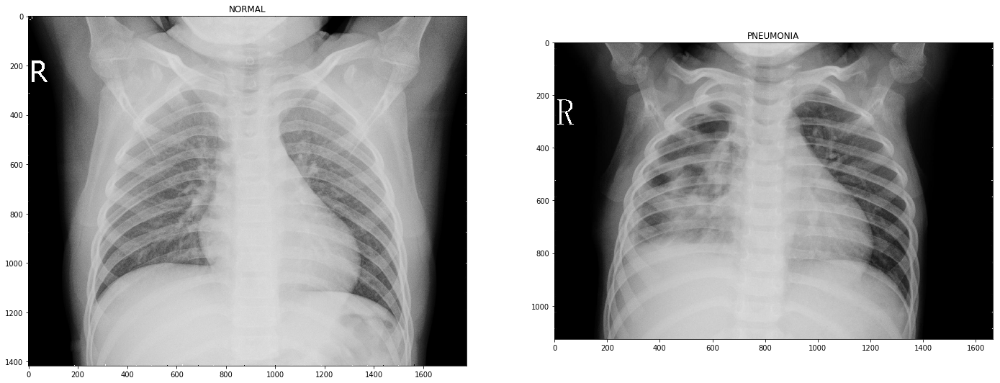

In [0]:
plt.rcParams['figure.figsize'] = (24.0, 12.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
plt.subplot(1, 2, 1).set_title('NORMAL')
plt.imshow(cv2.imread('./chest_xray/val/NORMAL/NORMAL2-IM-1427-0001.jpeg'))
plt.subplot(1, 2, 2).set_title('PNEUMONIA')
plt.imshow(cv2.imread('./chest_xray/val/PNEUMONIA/person1954_bacteria_4886.jpeg'));

In [0]:
def prnt_imgs(path, label):
  print(label)
  multipleImages = glob.glob(path)
  i_ = 0
  plt.rcParams['figure.figsize'] = (16.0, 16.0)
  plt.subplots_adjust(wspace=0, hspace=0)
  for l in multipleImages[:25]:
      im = cv2.imread(l)
      im = cv2.resize(im, (128, 128)) 
      plt.subplot(5, 5, i_+1) #.set_title(l)
      plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); 
      plt.axis('off')
      i_ += 1
      

Normal


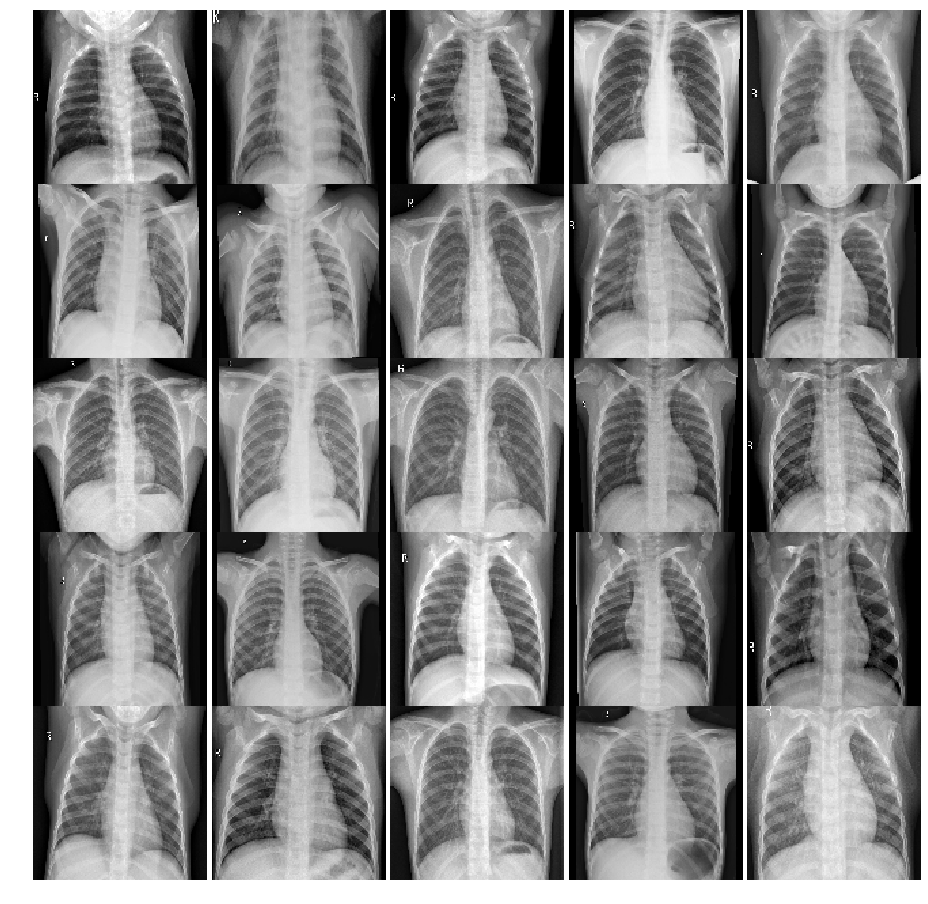

In [0]:
prnt_imgs('./chest_xray/test/NORMAL/**', "Normal")

Pneumonia


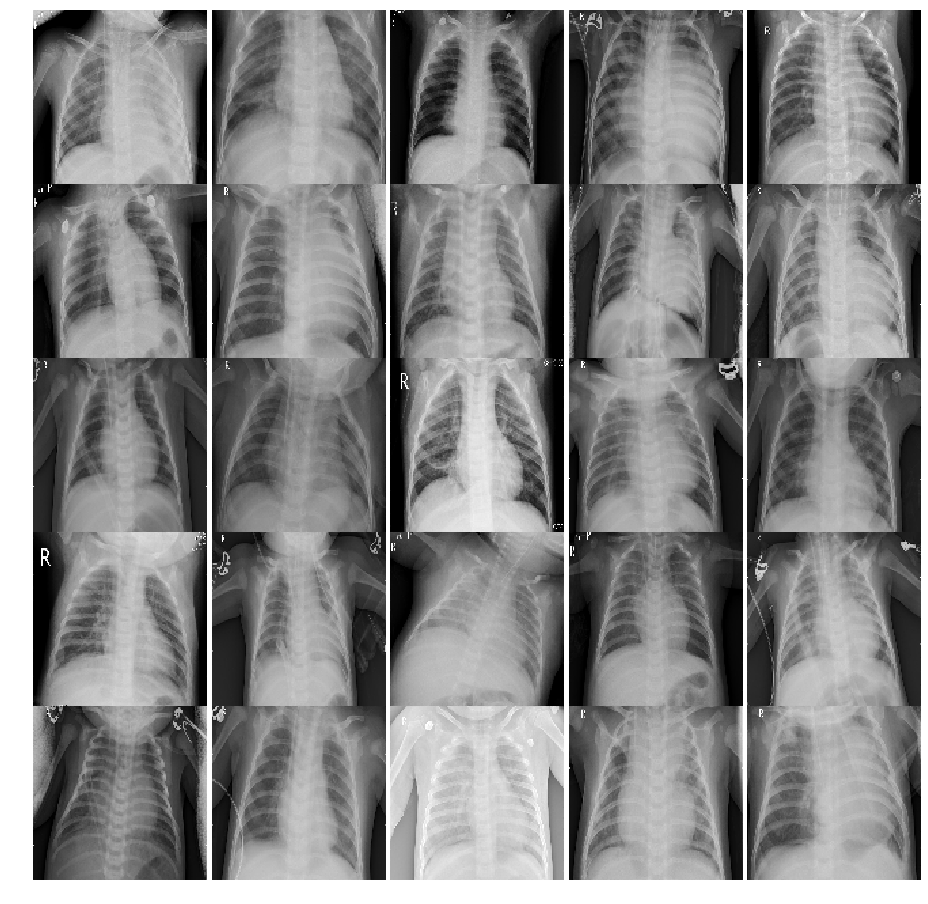

In [0]:
prnt_imgs('./chest_xray/train/PNEUMONIA/**', "Pneumonia")

## Process the images


In [0]:
import keras
from keras import backend as K 
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.layers.normalization import BatchNormalization
from keras.applications import MobileNet
from keras.preprocessing import image
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.optimizers import Adam, Adamax
from keras.callbacks import ReduceLROnPlateau , ModelCheckpoint

In [0]:
#included in our dependencies
train_datagen=ImageDataGenerator(preprocessing_function=preprocess_input,
                                 zoom_range=0.1,
                                 horizontal_flip=False)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)#(rescale=1./255)

In [300]:
# this is where you specify the path to the main data folder
train_generator=train_datagen.flow_from_directory(
    './chest_xray/train/', 
    target_size=(224,224),
    color_mode='rgb',
    batch_size=32,
    class_mode='categorical',
    shuffle=True)

validation_generator = test_datagen.flow_from_directory(
    './chest_xray/test/',
    target_size=(224,224),
    color_mode='rgb',
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

Found 5216 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


# Model
Fine Tuning MobileNet

In [0]:
K.clear_session()

In [0]:
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2, 
                              min_delta=0.0001, patience=1, verbose=1)

In [0]:
filepath="weights.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', 
                             verbose=1, save_best_only=True, mode='min')

In [222]:
#from keras.applications.mobilenet_v2 import MobileNetV2
#base_model = MobileNetV2(weights='imagenet',include_top=False)

#imports the mobilenet model and discards the last 1000 neuron layer.
base_model = MobileNet(weights='imagenet',include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(rate=1-0.5)(x) 
#x = Dense(512, kernel_regularizer='l2', kernel_initializer='he_normal', activation='relu')(x)
#x = BatchNormalization()(x)
#x = Dropout(rate=1-0.5)(x) 
x = Dense(256, kernel_regularizer='l2', kernel_initializer='he_normal', activation='relu')(x)
x = Dropout(rate=1-0.5)(x)
preds = Dense(2, activation='softmax')(x) #final layer with softmax activation

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet.py:208: UserWarning: MobileNet shape is undefined. Weights for input shape (224, 224) will be loaded.
  warnings.warn('MobileNet shape is undefined.'


Insert a batch normalization layer between convolution and activation layers and do note use dropout to conv layers [(source)](http://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture6.pdf)

In [0]:
model = Model(inputs=base_model.input, outputs=preds)

In [224]:
print('the network has {} layers'.format(len(model.layers)))

the network has 92 layers


We freeze the first 65, because we want to maintain the abstract shapes that MobileNet has learned from imagenet dataset

In [225]:
model.layers[53:] # 65layers: val_loss: 0.3193 - val_acc: 0.8885
#model.layers[34:] #try to train more layers  34

In [0]:
for layer in model.layers[:53]:
    layer.trainable=False
for layer in model.layers[53:]:
    layer.trainable=True

In [0]:
opt = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0001, amsgrad=False)
#opt = Adamax(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
model.compile(optimizer=opt,
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

In [228]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
__________

In [229]:
step_size_train = train_generator.n//train_generator.batch_size
step_size_val = validation_generator.n//validation_generator.batch_size

history = model.fit_generator(generator=train_generator,
                              validation_data=validation_generator,
                              steps_per_epoch=step_size_train,
                              validation_steps=step_size_val,
                              callbacks=[lr_reduce,checkpoint],
                              epochs=5)

Epoch 1/5
163/163 [==============================] - 127s 778ms/step - loss: 2.6352 - acc: 0.9484 - val_loss: 3.7365 - val_acc: 0.6672

Epoch 00001: val_loss improved from inf to 3.73654, saving model to weights.hdf5
Epoch 2/5
163/163 [==============================] - 116s 714ms/step - loss: 0.5945 - acc: 0.9766 - val_loss: 0.6297 - val_acc: 0.8784

Epoch 00002: val_loss improved from 3.73654 to 0.62968, saving model to weights.hdf5
Epoch 3/5
163/163 [==============================] - 121s 741ms/step - loss: 0.1910 - acc: 0.9845 - val_loss: 0.4845 - val_acc: 0.8159

Epoch 00003: val_loss improved from 0.62968 to 0.48452, saving model to weights.hdf5
Epoch 4/5
163/163 [==============================] - 121s 745ms/step - loss: 0.1110 - acc: 0.9812 - val_loss: 0.4706 - val_acc: 0.8834

Epoch 00004: val_loss improved from 0.48452 to 0.47060, saving model to weights.hdf5
Epoch 5/5
163/163 [==============================] - 121s 742ms/step - loss: 0.0597 - acc: 0.9881 - val_loss: 1.1246 - v

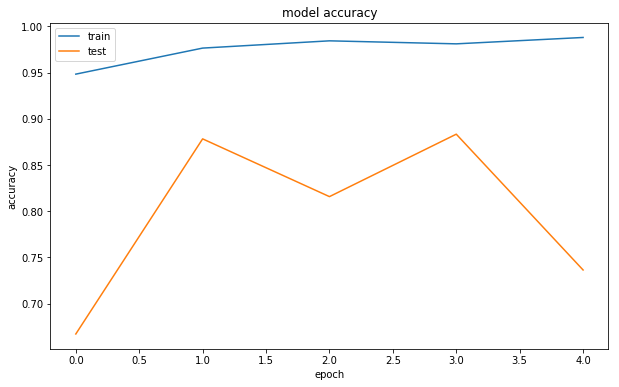

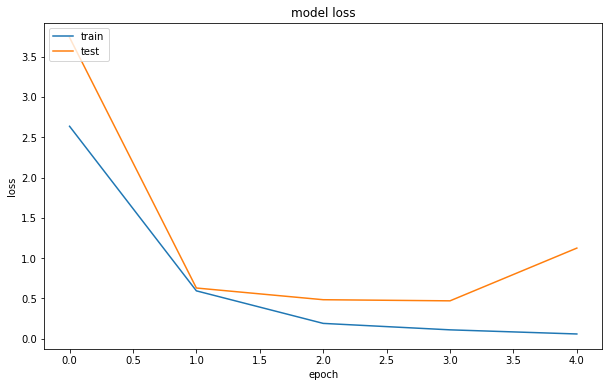

In [301]:
plt.rcParams['figure.figsize'] = (10.0, 6.0)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

The network is clearly overfitting after 2nd epoch, thus we saved the weights of the epoch with the lowerst validation error

In [0]:
model.load_weights('weights.hdf5')

# Confusion Matrix

In [0]:
def proc_img(img_path):
  "process the image"
  # `img` is a PIL image of size 224x224
  img = image.load_img(img_path, target_size=(224, 224))

  # `x` is a float32 Numpy array of shape (224, 224, 3)
  x_img = image.img_to_array(img)

  # We add a dimension to transform our array into a matrix
  # of size (1, 224, 224, 3)
  x_img = np.expand_dims(x_img, axis=0)

  # Finally we preprocess the batch
  # (this does channel-wise color normalization)
  #x_img = preprocess_input(x_img)
  x_img = preprocess_input(x_img)
  return x_img

In [0]:
test_path = Path('./chest_xray/test')

# Get the path to the normal and pneumonia sub-directories
normal_cases_dir = test_path / 'NORMAL'
pneumonia_cases_dir = test_path / 'PNEUMONIA'

# Get the list of all the images
normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

# An empty list. We will insert the data into this list in (img_path, label) format
test_data = []

# Go through all the normal cases. The label for these cases will be 0
for img in normal_cases:
    test_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    test_data.append((img, 1))

# Get a pandas dataframe from the data we have in our list 
test_data = pd.DataFrame(test_data, columns=['image', 'label'], index=None)

# Shuffle the data 
test_data = test_data.sample(frac=1.).reset_index(drop=True)

In [304]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 2 columns):
image    624 non-null object
label    624 non-null int64
dtypes: int64(1), object(1)
memory usage: 9.8+ KB


In [305]:
test_data.head()

,image,label
0,chest_xray/test/PNEUMONIA/person101_bacteria_4...,1
1,chest_xray/test/NORMAL/IM-0019-0001.jpeg,0
2,chest_xray/test/NORMAL/NORMAL2-IM-0246-0001-00...,0
3,chest_xray/test/PNEUMONIA/person91_bacteria_44...,1
4,chest_xray/test/NORMAL/NORMAL2-IM-0251-0001.jpeg,0


In [0]:
x_test = np.zeros((624, 224, 224, 3))
i = 0
for l in test_data['image']:
  im_path = './'+np.str(l)
  x_test[i] = np.asarray(proc_img(im_path))
  i+=1
  
y_test_true = np.asarray(test_data['label'])

In [0]:
y_test_pred = np.argmax(model.predict(x_test), axis=1)

In [0]:
from sklearn.metrics import confusion_matrix

def recall(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  return tp/(tp+fn)


def precision(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  return tp/(tp+fp)

<Figure size 720x432 with 0 Axes>

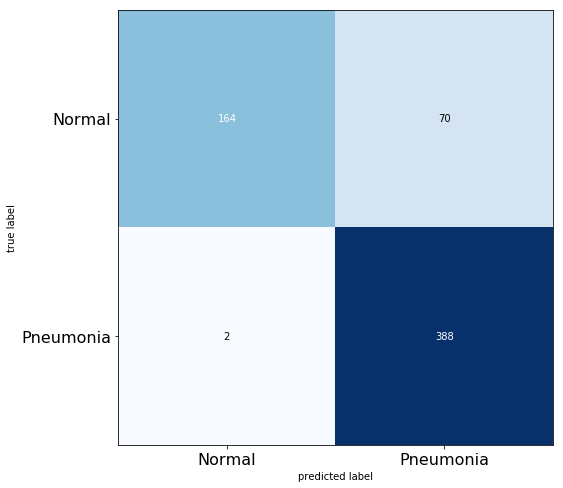

In [233]:
from mlxtend.plotting import plot_confusion_matrix
cm  = confusion_matrix(y_test_true, y_test_pred)
plt.figure()
plot_confusion_matrix(cm,figsize=(12,8), hide_ticks=True,cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.show()

In [234]:
recall(y_test_true, y_test_pred)

0.9948717948717949

In [235]:
precision(y_test_true, y_test_pred)

0.8471615720524017

# Visualizing heatmaps of class activation

In [0]:
def prnt_out(x_img):
  "prints the probability that the model predict with its label"
  pred = model.predict(x_img)
  if pred[0,0] >= 0.5: 
      print('Our network is {:.2%} sure this is NORMAL'.format(pred[0][0]))
  else: 
      print('Our network is {:.2%} sure this is PNEUMONIA'.format(1-pred[0][0]))

In [0]:
"""To visualize which parts of the image are the most important for the each  
label for the classifier, let’s set up the Grad-CAM process."""

blck = 'conv_pw_13'  #MobileNet
#blck ='conv_pw_13_relu'
#blck = 'Conv_1'  #MobileNetV2
def xray_CAM(x_img, blck, label): 
  "gives the CAM heatmap"
  #normal=0 and pneumonia=1

  # the prediction vector
  pred_output = model.output[:, label]

  # The is the output feature map of the `conv_pw_13` layer,
  # the last convolutional layer in MobileNet
  last_conv_layer = model.get_layer(blck)

  # This is the gradient of the image's class with regard to
  # the output feature map of `conv_pw_13`
  grads = K.gradients(pred_output, last_conv_layer.output)[0]

  # This is a vector of shape (512,), where each entry
  # is the mean intensity of the gradient over a specific feature map channel
  pooled_grads = K.mean(grads, axis=(0, 1, 2))

  # This function allows us to access the values of the quantities we just defined:
  # `pooled_grads` and the output feature map of `block5_conv3`,
  # given a sample image
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

  # These are the values of these two quantities, as Numpy arrays,
  # given our sample image of two elephants
  pooled_grads_value, conv_layer_output_value = iterate([x_img])

  # We multiply each channel in the feature map array
  # by "how important this channel is" with regard to the elephant class
  for i in range(1024): # we have 1024 features in our last conv layer
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  # The channel-wise mean of the resulting feature map
  # is our heatmap of class activation
  heatmap = np.mean(conv_layer_output_value, axis=-1) # create a heatmap
  heatmap = np.maximum(heatmap, 0)  # remove negative values
  heatmap /= np.max(heatmap)  # normalize
  
  return heatmap

In [0]:
def show_on_xray(img_path, heatmap):
  # We use cv2 to load the original image
  img = cv2.imread(img_path)

  # We resize the heatmap to have the same size as the original image
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  # We convert the heatmap to RGB
  heatmap = np.uint8(255 * heatmap)

  # We apply the heatmap to the original image
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

  # 0.4 here is a heatmap intensity factor
  superimposed_img = heatmap * 0.4 + img

  ## Save the image to disk
  cv2.imwrite('./xray_cam.jpg', superimposed_img)
  img_samp = cv2.imread('./xray_cam.jpg')  #OpenCV has BGR order
  img_samp = cv2.cvtColor(img_samp, cv2.COLOR_BGR2RGB)  #matplotlib has RGB order
  
  plt.imshow(img_samp)

In [0]:
# The local path to our target image
#img_path = './chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg'
img_path ='./chest_xray/test/PNEUMONIA/person100_bacteria_475.jpeg'

x_img = proc_img(img_path)

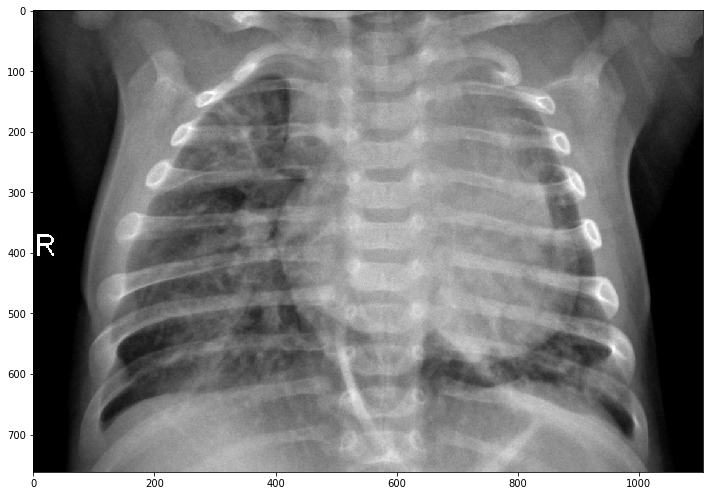

In [237]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp = cv2.imread(img_path)
plt.imshow(img_samp);

In [238]:
prnt_out(x_img)

Our network is 100.00% sure this is PNEUMONIA


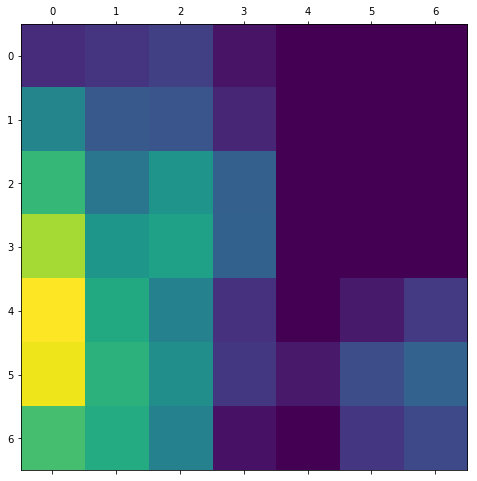

In [239]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
heatmap = xray_CAM(x_img, blck, 1)
plt.matshow(heatmap)
plt.show()

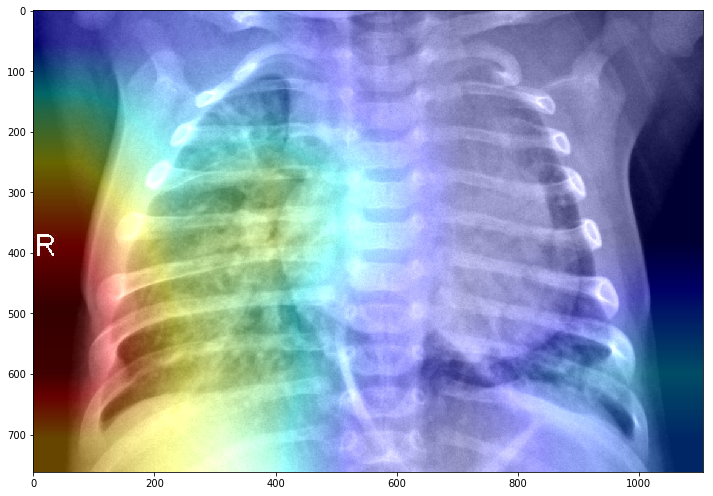

In [240]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

In [320]:
img_path = './chest_xray/test/PNEUMONIA/person100_bacteria_477.jpeg'
x_img = proc_img(img_path)
prnt_out(x_img)

Our network is 100.00% sure this is PNEUMONIA


Another Case of Pneumonia

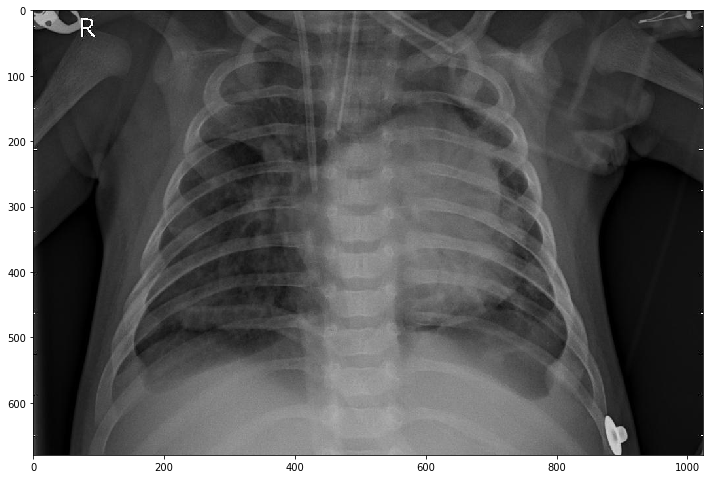

In [321]:
img_samp_n = cv2.imread(img_path)
plt.imshow(img_samp_n);

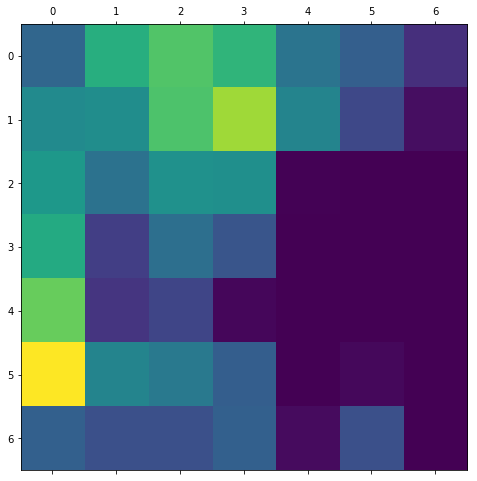

In [322]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
heatmap = xray_CAM(x_img, blck, 1)
plt.matshow(heatmap)
plt.show()

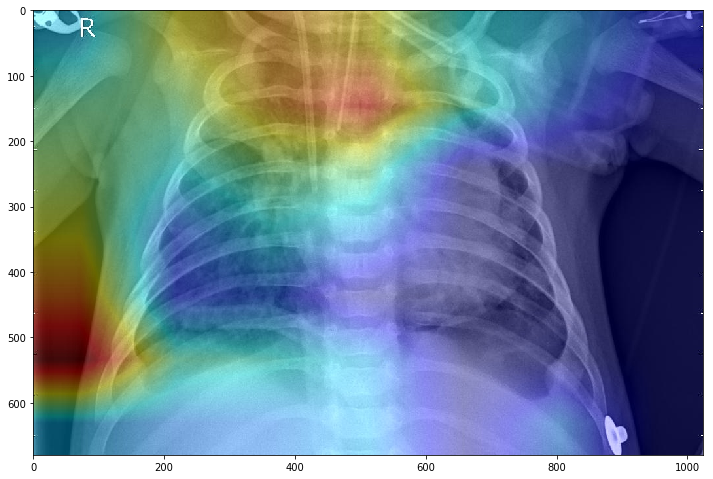

In [323]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

### NORMAL

In [291]:
img_path_n = './chest_xray/val/NORMAL/NORMAL2-IM-1431-0001.jpeg'
#img_path = './chest_xray/val/NORMAL/NORMAL2-IM-1427-0001.jpeg'
#img_path = './chest_xray/val/NORMAL/NORMAL2-IM-1430-0001.jpeg'
x_img_n = proc_img(img_path_n)
prnt_out(x_img_n) 

Our network is 90.54% sure this is NORMAL


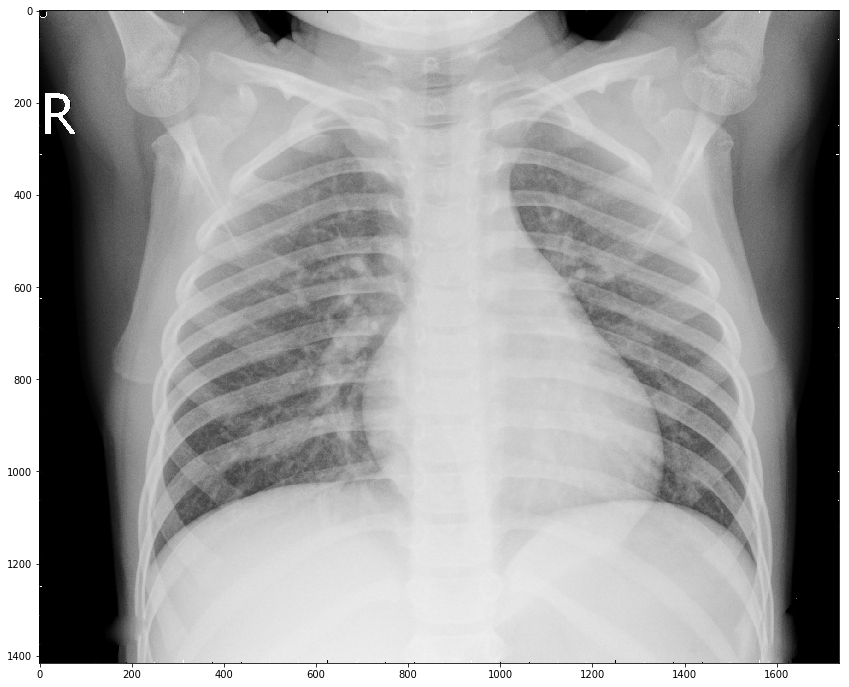

In [292]:
img_samp_n = cv2.imread(img_path_n)
plt.imshow(img_samp_n);

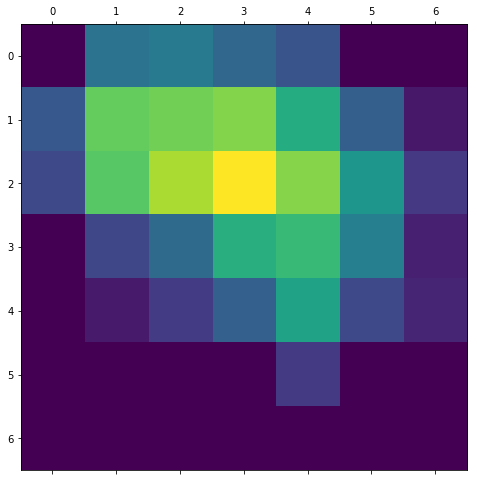

In [293]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
heatmap_n = xray_CAM(x_img_n, blck, 0)
plt.matshow(heatmap_n)
plt.show()

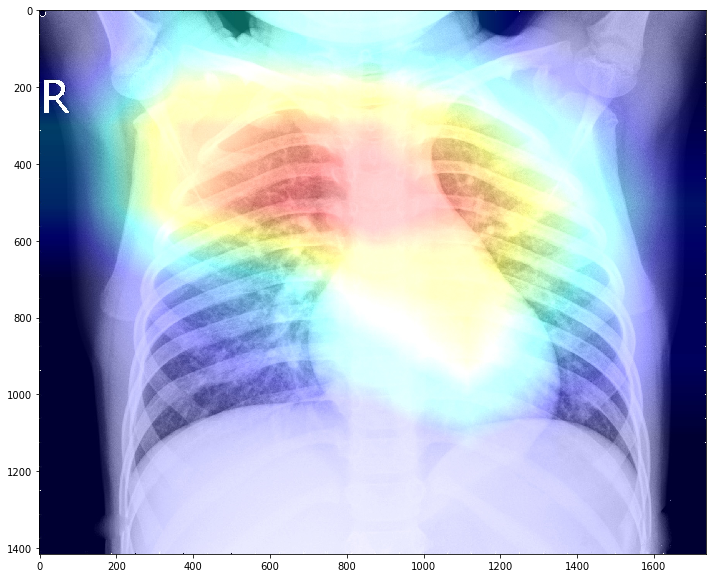

In [294]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path_n, heatmap_n)

In [315]:
img_path_n = './chest_xray/test/NORMAL/IM-0003-0001.jpeg'
x_img_n = proc_img(img_path_n)
prnt_out(x_img_n)

Our network is 99.48% sure this is NORMAL


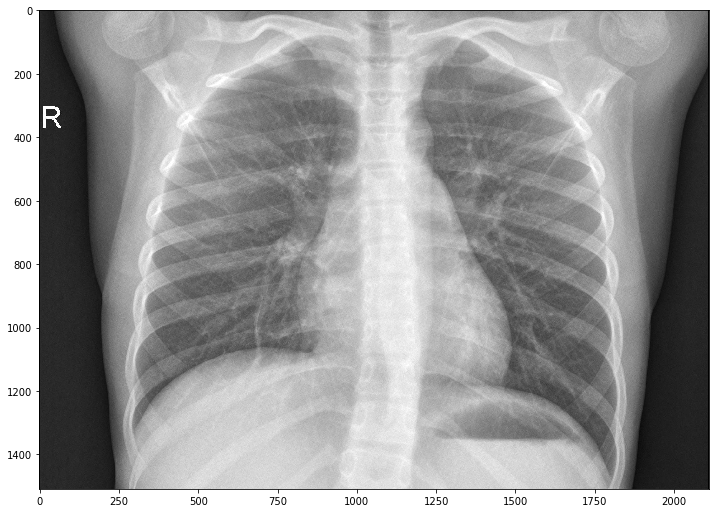

In [316]:
img_samp_n = cv2.imread(img_path_n)
plt.imshow(img_samp_n);

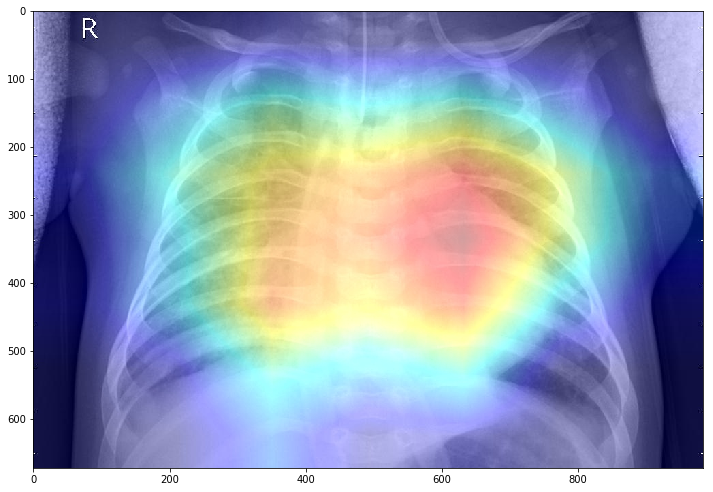

In [318]:
heatmap = xray_CAM(x_img_n, blck, 0)
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

# Display more unseen x-rays

In [0]:
sample_path = Path('./chest_xray/val')

# Get the path to the normal and pneumonia sub-directories
normal_cases_dir = sample_path / 'NORMAL'
pneumonia_cases_dir = sample_path / 'PNEUMONIA'

# Get the list of all the images
normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

# An empty list. We will insert the data into this list in (img_path, label) format
sample_data = []

# Go through all the normal cases. The label for these cases will be 0
for img in normal_cases:
    sample_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    sample_data.append((img, 1))

# Get a pandas dataframe from the data we have in our list 
sample_data = pd.DataFrame(sample_data, columns=['image', 'label'], index=None)

# Shuffle the data 
sample_data = sample_data.sample(frac=1.).reset_index(drop=True)

In [0]:
sample_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 2 columns):
image    16 non-null object
label    16 non-null int64
dtypes: int64(1), object(1)
memory usage: 336.0+ bytes


In [0]:
sample_data.head()

,image,label
0,chest_xray/val/PNEUMONIA/person1952_bacteria_4...,1
1,chest_xray/val/PNEUMONIA/person1951_bacteria_4...,1
2,chest_xray/val/PNEUMONIA/person1947_bacteria_4...,1
3,chest_xray/val/NORMAL/NORMAL2-IM-1430-0001.jpeg,0
4,chest_xray/val/NORMAL/NORMAL2-IM-1437-0001.jpeg,0


NORMAL


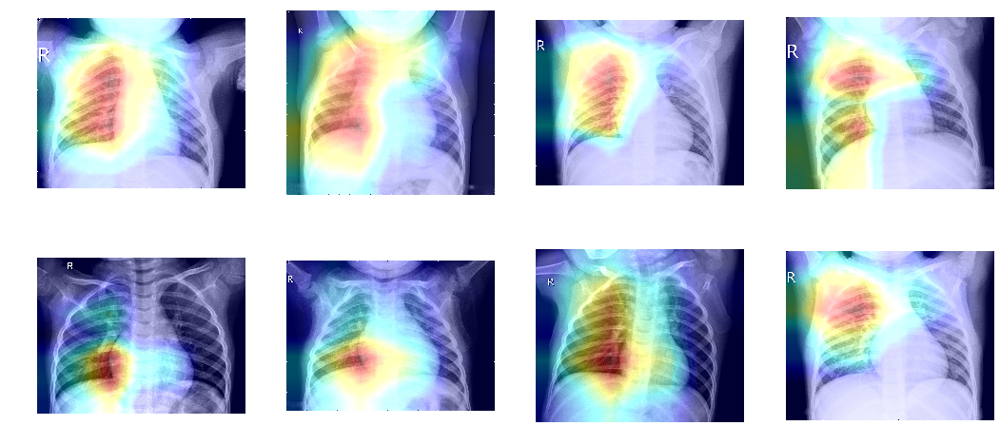

In [0]:
print('NORMAL')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in sample_data['image'][sample_data['label']==0]:
    #im = cv2.imread(l)
    #im = cv2.resize(im, (128, 128)) 
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 0)); #0=normal
    plt.axis('off')
    i_ += 1

PNEUMONIA


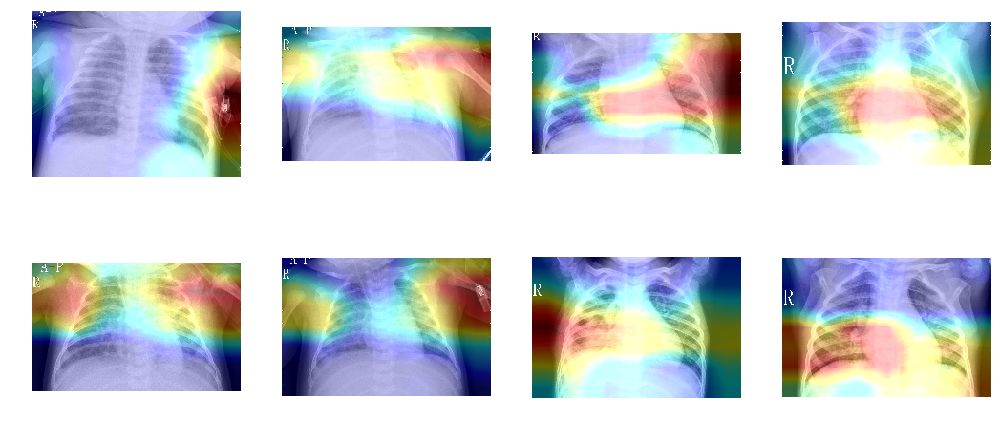

In [0]:
print('PNEUMONIA')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in sample_data['image'][sample_data['label']==1]:
    #im = cv2.imread(l)
    #im = cv2.resize(im, (128, 128)) 
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 1)); #1=pneumonia
    plt.axis('off')
    i_ += 1

PNEUMONIA


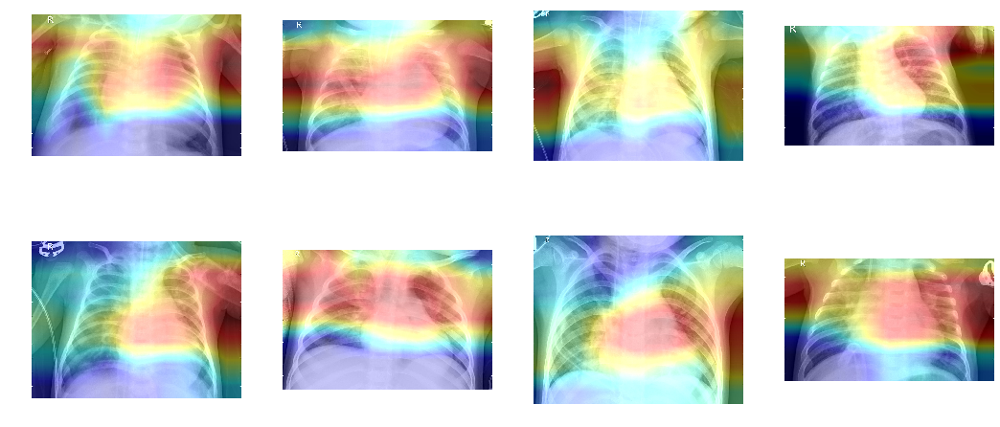

In [0]:
print('PNEUMONIA')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in test_data['image'][test_data['label']==1][:8]:
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 1)); #1=pneumonia
    plt.axis('off')
    i_ += 1

# Lime: explaining image prediction

In [246]:
!pip install lime

     |████████████████████████████████| 276kB 2.8MB/s 
  Stored in directory: /root/.cache/pip/wheels/2f/8e/c1/c1cddd9cf8fbae812904fa5c84ef571e782891288d309d04c8
Successfully built lime


In [0]:
import lime
from lime import lime_image
from skimage.io import imread
from skimage.segmentation import mark_boundaries

In [0]:
# img_path ='./chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg'
# img_path = './chest_xray/test/PNEUMONIA/person100_bacteria_477.jpeg'
img_path = './chest_xray/test/PNEUMONIA/person100_bacteria_475.jpeg'

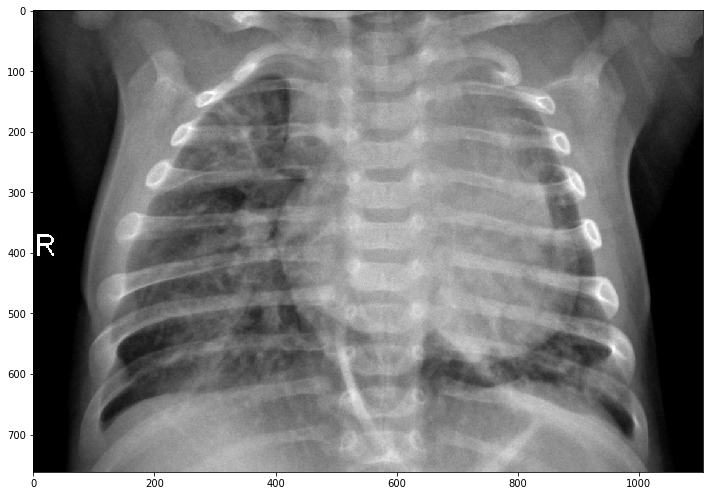

In [279]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp_n = cv2.imread(img_path)
plt.imshow(img_samp_n);

In [280]:
p_img = proc_img(img_path)
prnt_out(p_img) 

Our network is 100.00% sure this is PNEUMONIA


In [0]:
explainer = lime_image.LimeImageExplainer()

**explain_instance**(image, classifier_fn,  top_labels=5, hide_color=None,  num_samples=1000, distance_metric='cosine')



* **top_labels** – if not None, ignore labels and produce explanations for the K labels with highest prediction probabilities, where K is this parameter.
* **num_features** – maximum number of features present in explanation
* **num_samples** – size of the neighborhood to learn the linear model
* **distance_metric** – the distance metric to use for weights.



In [0]:
explanation = explainer.explain_instance(p_img[0], model.predict, 
                                         top_labels=2, hide_color=0,
                                         num_samples=1000,
                                         distance_metric='cosine')

**get_image_and_mask**(label, positive_only=True, hide_rest=False, num_features=5, min_weight=0.0)

* **label** – label to explain
* **positive_only** – if True, only take superpixels that contribute to the prediction of the label. Otherwise, use the top num_features superpixels, which can be positive or negative towards the label
* **hide_rest** – if True, make the non-explanation part of the return image gray
* **num_features** – number of superpixels to include in explanation



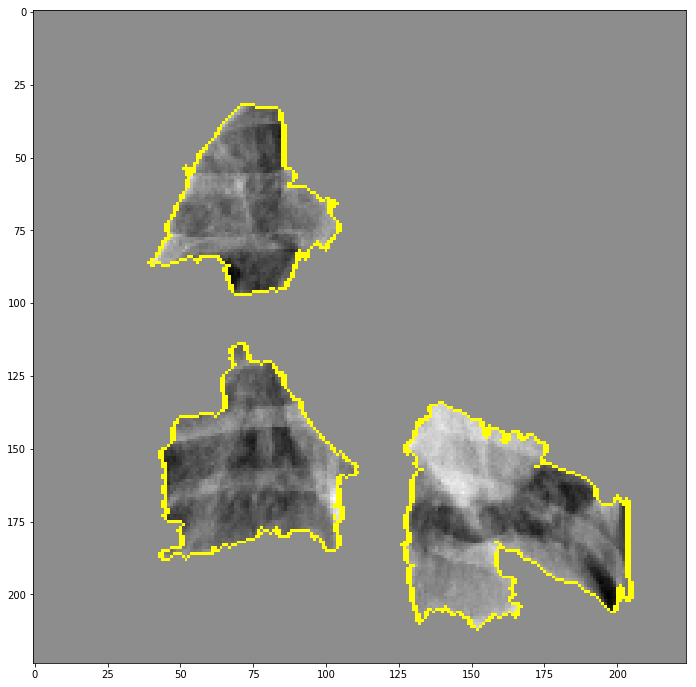

In [288]:
temp, mask = explanation.get_image_and_mask(label=1, positive_only=True, 
                                            num_features=15, hide_rest=True,
                                            min_weight=0.0000004)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.rcParams['figure.figsize'] = (16.0, 12.0)
plt.imshow(mark_boundaries(tempp, mask));

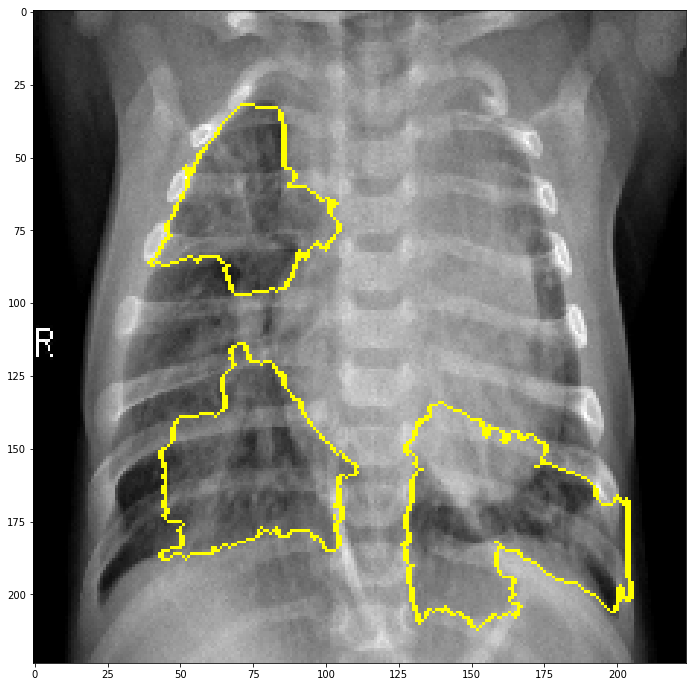

In [289]:
temp, mask = explanation.get_image_and_mask(label=1, positive_only=True, 
                                            num_features=15, hide_rest=False,
                                            min_weight=0.0000004)

tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.imshow(mark_boundaries(tempp, mask));

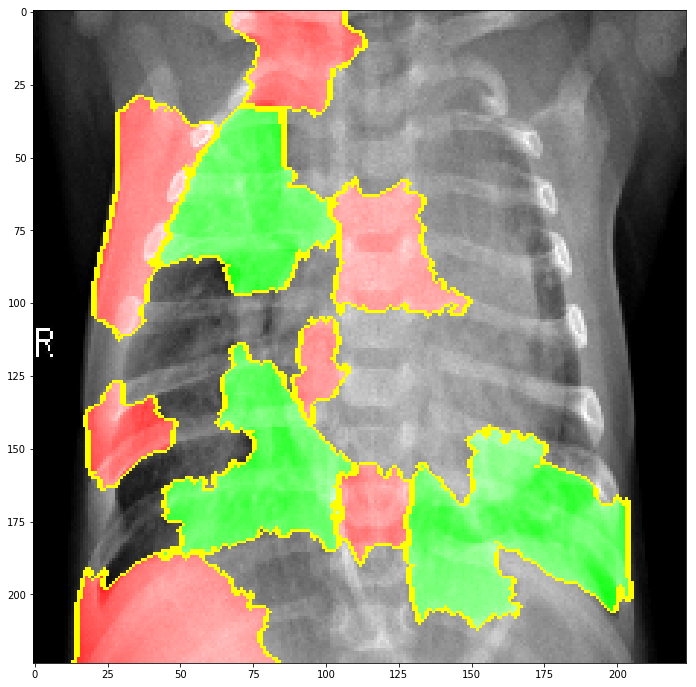

In [290]:
temp, mask = explanation.get_image_and_mask(label=1, positive_only=False, 
                                            num_features=15, hide_rest=False, 
                                            min_weight=0.0000004)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.imshow(mark_boundaries(tempp, mask));

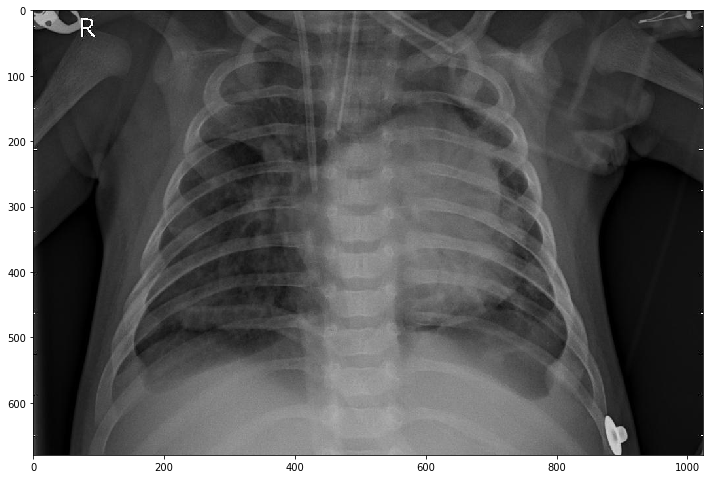

In [264]:
img_path = './chest_xray/test/PNEUMONIA/person100_bacteria_477.jpeg'
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp_n = cv2.imread(img_path)
plt.imshow(img_samp_n);

In [265]:
p_img = proc_img(img_path)
prnt_out(p_img) 

Our network is 100.00% sure this is PNEUMONIA


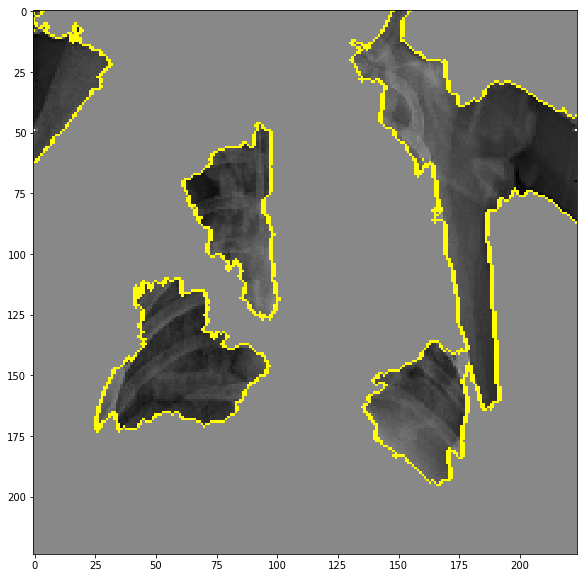

In [272]:
explanation = explainer.explain_instance(p_img[0], model.predict, 
                                         top_labels=2, hide_color=0,
                                         num_samples=1000,
                                         distance_metric='cosine')

temp, mask = explanation.get_image_and_mask(label=1, positive_only=True, 
                                            num_features=15, hide_rest=True,
                                            min_weight=0.00000001)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.rcParams['figure.figsize'] = (12.0, 10.0)
plt.imshow(mark_boundaries(tempp, mask));

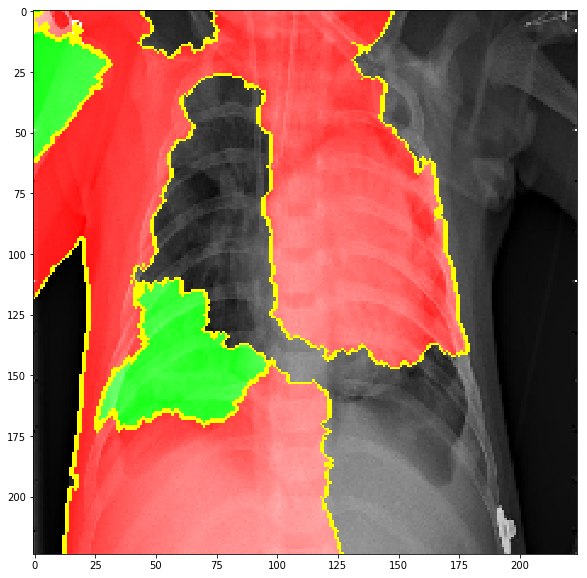

In [273]:
temp, mask = explanation.get_image_and_mask(label=1, positive_only=False, 
                                            num_features=15, hide_rest=False,
                                            min_weight=0.00000001)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.rcParams['figure.figsize'] = (12.0, 10.0)
plt.imshow(mark_boundaries(tempp, mask));

## NORMAL X-Ray

In [0]:
#p_img = proc_img('./chest_xray/test/NORMAL/IM-0001-0001.jpeg')
p_img = proc_img('./chest_xray/test/NORMAL/IM-0003-0001.jpeg')

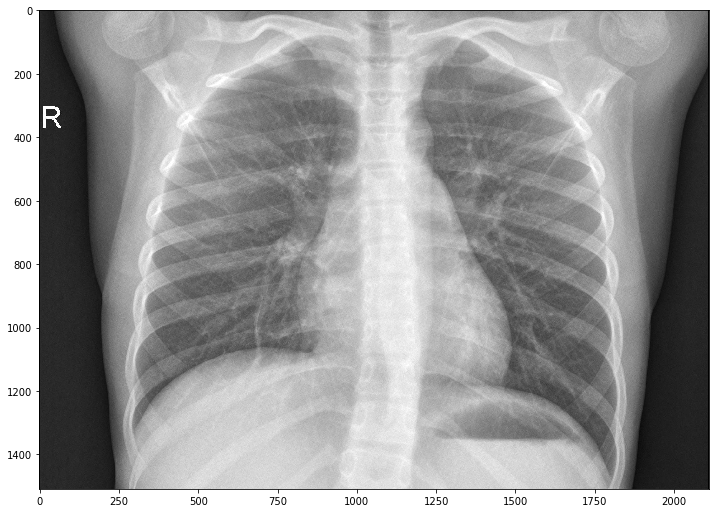

In [313]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp_n = cv2.imread('./chest_xray/test/NORMAL/IM-0003-0001.jpeg')
plt.imshow(img_samp_n);

In [314]:
p_img = proc_img('./chest_xray/test/NORMAL/IM-0003-0001.jpeg')
prnt_out(p_img)

Our network is 99.48% sure this is NORMAL


In [0]:
#p_img = proc_img('./chest_xray/val/NORMAL/NORMAL2-IM-1431-0001.jpeg')
p_img = proc_img('./chest_xray/test/NORMAL/IM-0003-0001.jpeg')
explanation = explainer.explain_instance(p_img[0], model.predict, 
                                         top_labels=2, hide_color=0,
                                         num_samples=1000)

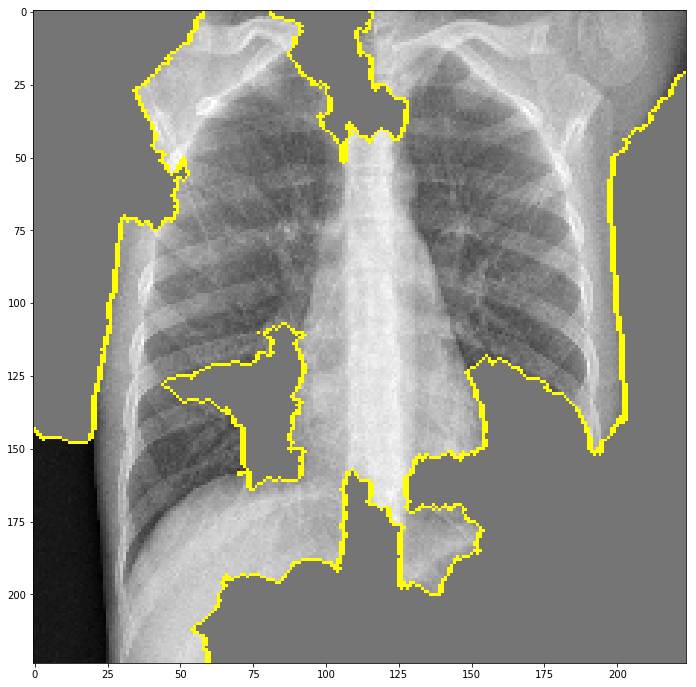

In [0]:
temp, mask = explanation.get_image_and_mask(label=0, positive_only=True, 
                                            num_features=15, hide_rest=True,
                                            min_weight=0.005)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.rcParams['figure.figsize'] = (16.0, 12.0)
plt.imshow(mark_boundaries(tempp, mask));

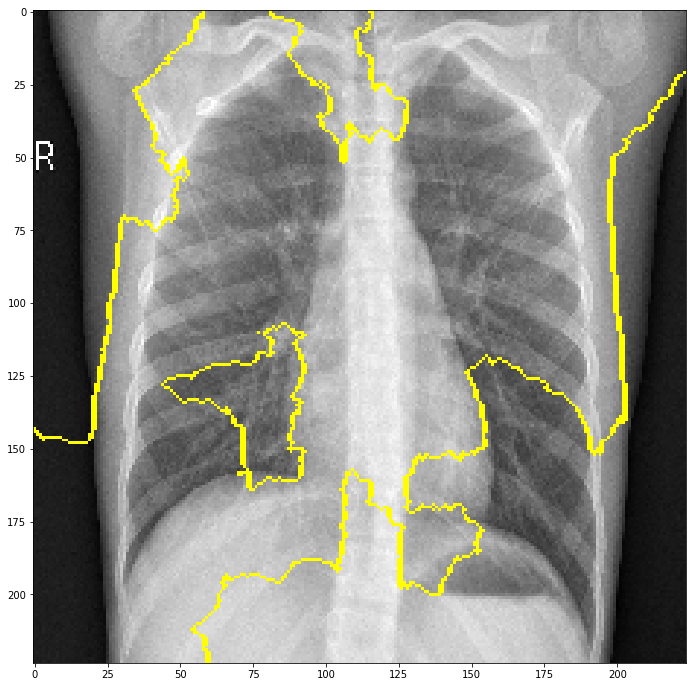

In [0]:
temp, mask = explanation.get_image_and_mask(label=0, positive_only=True, 
                                            num_features=15, hide_rest=False, 
                                            min_weight=0.005)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.imshow(mark_boundaries(tempp, mask));

We can also see the 'pros and cons' (pros in green, cons in red) that have weight at least 0.05

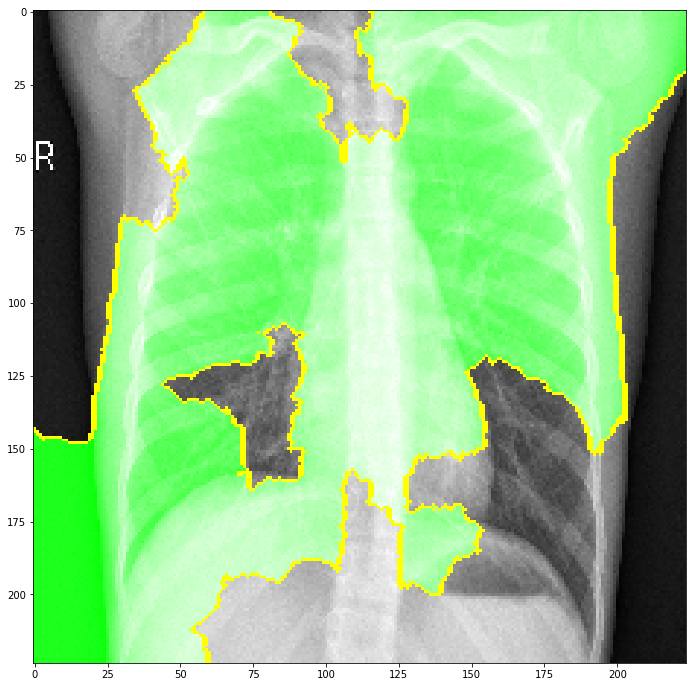

In [0]:
temp, mask = explanation.get_image_and_mask(label=0, positive_only=False, 
                                            num_features=15, hide_rest=False, 
                                            min_weight=0.0005)
tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
plt.imshow(mark_boundaries(tempp, mask));

## Display more X-rays

In [0]:
print('NORMAL')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in sample_data['image'][sample_data['label']==0]:
    
    
    plt.subplot(4, 4, i_+1) 
    img_path = './'+np.str(l)
    p_img = proc_img(img_path)
    explanation = explainer.explain_instance(p_img[0], model.predict, 
                                         top_labels=2, hide_color=0,
                                         num_samples=1000)

    temp, mask = explanation.get_image_and_mask(label=0, positive_only=True, 
                                            num_features=15, hide_rest=True)
    tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
    
    plt.imshow(mark_boundaries(tempp, mask));
    
    plt.axis('off')
    i_ += 1

PNEUMONIA


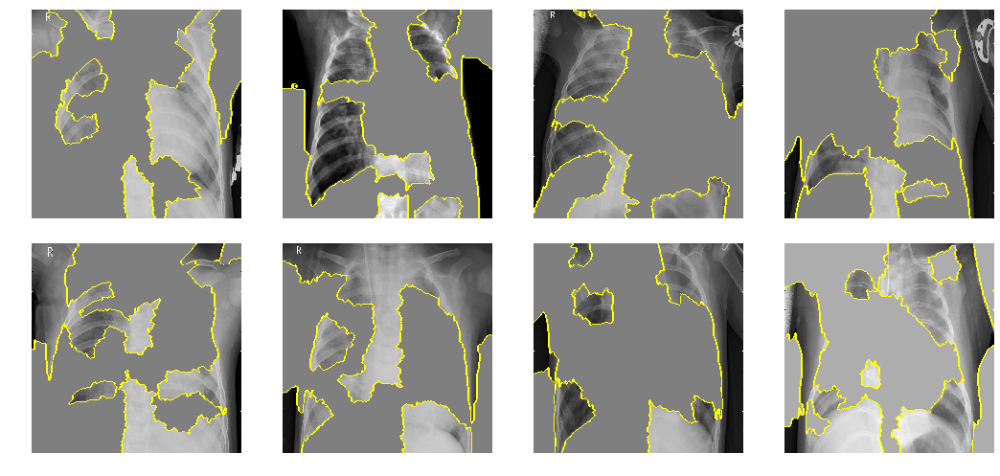

In [312]:
print('PNEUMONIA')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in test_data['image'][test_data['label']==1][:8]:
    
    
    plt.subplot(4, 4, i_+1) 
    img_path = './'+np.str(l)
    p_img = proc_img(img_path)
    explanation = explainer.explain_instance(p_img[0], model.predict, 
                                         top_labels=2, hide_color=0,
                                         num_samples=1000)

    temp, mask = explanation.get_image_and_mask(label=1, positive_only=True, 
                                            num_features=15, hide_rest=True)
    tempp = np.interp(temp, (temp.min(), temp.max()), (0, +1))
    
    plt.imshow(mark_boundaries(tempp, mask));
    
    plt.axis('off')
    i_ += 1

# References:


1. Dataset: https://www.kaggle.com/paultimothymooney/detecting-pneumonia-in-x-ray-images
2. MobileNet: https://arxiv.org/abs/1704.04861
3. Grad-CAM: https://arxiv.org/abs/1610.02391
4. Francois Chollet - Deep Learning with Python (2017, Manning Publications), Chapter 5
5. https://medium.com/@mohamedchetoui/grad-cam-gradient-weighted-class-activation-mapping-ffd72742243a
6. http://www.hackevolve.com/where-cnn-is-looking-grad-cam/
7. Lime library: https://github.com/marcotcr/lime
8. Model-Agnostic Interpretability of Machine Learning https://arxiv.org/abs/1606.05386
9. "Why Should I Trust You?": Explaining the Predictions of Any Classifier https://arxiv.org/abs/1602.04938
10. https://towardsdatascience.com/understanding-how-lime-explains-predictions-d404e5d1829c
